# TLT SSD example usecase



0. [设置环境变量](#head-0)
1. [准备数据集和预训练模型](#head-1) <br>
    1.1 [将数据集从kitti格式转换成tfrecords的格式](#head-1-1) <br>
    1.2 [下载预训练模型](#head-1-2) <br>
2. [定义训练设置](#head-2)
3. [开始TLT训练](#head-3)
4. [评估训练结果](#head-4)
5. [模型剪枝](#head-5)
6. [训练剪枝模型](#head-6)
7. [评估训练好的模型](#head-7)
8. [可视化推理结果](#head-8)
9. [模型部署](#head-9)

## 0. 设置环境变量 <a class="anchor" id="head-0"></a>


In [1]:
# 设置环境变量.
print("Please replace the variable with your key.")
# 请从NGC官网生成API_KEY

# API_KEY updated
%set_env KEY=NmhuanZkZmVvZ28yY3ZianBlZWJyMzdhcWQ6ZWRjMmIzYmUtMDdkOS00ODZjLTgyOGUtMmRjZDNlOGExOTU1
%set_env USER_EXPERIMENT_DIR=/workspace/mydata/ssd
# %set_env DATA_DOWNLOAD_DIR=/workspace/mydata/ssd/data
%set_env SPECS_DIR=/workspace/mydata/ssd/specs
!mkdir -p $DATA_DOWNLOAD_DIR

Please replace the variable with your key.
env: KEY=NmhuanZkZmVvZ28yY3ZianBlZWJyMzdhcWQ6ZWRjMmIzYmUtMDdkOS00ODZjLTgyOGUtMmRjZDNlOGExOTU1
env: USER_EXPERIMENT_DIR=/workspace/mydata/ssd
env: SPECS_DIR=/workspace/mydata/ssd/specs
mkdir: missing operand
Try 'mkdir --help' for more information.


## 1. 准备数据集和预训练模型 <a class="anchor" id="head-1"></a>

 这里将使用kitti数据集。 可以访问下面链接查看详情：
 http://www.cvlibs.net/datasets/kitti/eval_object.php?obj_benchmark=2d. 
 
 从这里下载图片数据集 (http://www.cvlibs.net/download.php?file=data_object_image_2.zip)
 
 从这里下载标签(http://www.cvlibs.net/download.php?file=data_object_label_2.zip) 
 
 并把他们保存在$DATA_DOWNLOAD_DIR.

Additionally, if you have your own dataset already in a volume (or folder), you can mount the volume on `DATA_DOWNLOAD_DIR` (or create a soft link). Below shows an example:
```bash
# if your dataset is in /dev/sdc1
mount /dev/sdc1 $DATA_DOWNLOAD_DIR

# if your dataset is in folder /var/dataset
ln -sf /var/dataset $DATA_DOWNLOAD_DIR
```

In [2]:
# !ln -sf /home/jiahui/codes/image_ready $DATA_DOWNLOAD_DIR
!ln -sf /workspace/tlt-experiments/data/training $DATA_DOWNLOAD_DIR 

### 1.1 将数据集从KITTI格式转换成TFrecords <a class="anchor" id="head-1-1"></a>

* 更新tfrecords定义文件
* 使用tlt-dataset-convert 创建tfrecords
* TFRecords 只需要被创建一次

In [3]:
print("TFrecords conversion spec file for training")
!cat $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt

TFrecords conversion spec file for training
kitti_config {
  root_directory_path: "/workspace/tlt-experiments/data/training"
  image_dir_name: "image_2"
  label_dir_name: "label_2"
  image_extension: ".png"
  partition_mode: "random"
  num_partitions: 2
  val_split: 14
  num_shards: 10
}
image_directory_path: "/workspace/tlt-experiments/data/training"

In [4]:
# Creating a new directory for the output tfrecords dump.
!mkdir -p $USER_EXPERIMENT_DIR/tfrecords
#KITTI trainval
!tlt-dataset-convert -d $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt \
                     -o $DATA_DOWNLOAD_DIR/tfrecords/kitti_trainval/kitti_trainval

2020-10-12 07:14:57.255566: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
Using TensorFlow backend.
2020-10-12 07:15:00,964 - iva.detectnet_v2.dataio.build_converter - INFO - Instantiating a kitti converter
2020-10-12 07:15:00,978 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Num images in
Train: 2276	Val: 370
2020-10-12 07:15:00,978 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Validation data in partition 0. Hence, while choosing the validationset during training choose validation_fold 0.
2020-10-12 07:15:00,981 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing partition 0, shard 0

2020-10-12 07:15:00,981 - tensorflow - WARNING - From /home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/dataio/dataset_converter_lib.py:142: The name tf.python_

In [5]:
!ls -rlt $DATA_DOWNLOAD_DIR/tfrecords/kitti_trainval

total 1792
-rw-r--r-- 1 root root  25387 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00000-of-00010
-rw-r--r-- 1 root root  24487 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00001-of-00010
-rw-r--r-- 1 root root  24688 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00002-of-00010
-rw-r--r-- 1 root root  25502 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00003-of-00010
-rw-r--r-- 1 root root  25171 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00004-of-00010
-rw-r--r-- 1 root root  25337 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00005-of-00010
-rw-r--r-- 1 root root  24881 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00006-of-00010
-rw-r--r-- 1 root root  24810 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00007-of-00010
-rw-r--r-- 1 root root  26286 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00008-of-00010
-rw-r--r-- 1 root root  25472 Oct 12 07:15 kitti_trainval-fold-000-of-002-shard-00009-of-00010
-rw-r--r-- 1 root root 152307 Oct 12 07

### 1.2 下载模型 <a class="anchor" id="head-1-2"></a>

我们这里将使用NGC CLI来下载预训练模型. 访问 [ngc.nvidia.com](ngc.nvidia.com) 查看详情，点击 SETUP 查看教程.

In [6]:
!ngc registry model list nvidia/tlt_pretrained_object_detection:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| resne | 74.38 | 80    | 1     | V100  | 38.3  | 38.31 | UPLOA | Apr   |
| t10   |       |       |       |       |       | MB    | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| resne | 76.74 | 80    | 1     | V100  | 89.0  | 88.96 | UPLOA | Apr   |
| t18   |       |       |       |       |       | MB    | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| resne | 77.04 | 80    | 1     | V100  | 170.7 | 170.6 | UPLOA | Apr   |
| t34   |       |       |       |     

In [7]:
!mkdir -p $USER_EXPERIMENT_DIR/pretrained_resnet18/

In [8]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/tlt_pretrained_object_detection:resnet18 --dest $USER_EXPERIMENT_DIR/pretrained_resnet18

Downloaded 82.38 MB in 25s, Download speed: 3.29 MB/s               
----------------------------------------------------
Transfer id: tlt_pretrained_object_detection_vresnet18 Download status: Completed.
Downloaded local path: /workspace/mydata/ssd/pretrained_resnet18/tlt_pretrained_object_detection_vresnet18-2
Total files downloaded: 1 
Total downloaded size: 82.38 MB
Started at: 2020-10-11 11:15:06.120196
Completed at: 2020-10-11 11:15:31.149582
Duration taken: 25s
----------------------------------------------------


In [9]:
print("Check that model is downloaded into dir.")
!ls -l $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_pretrained_object_detection_vresnet18

Check that model is downloaded into dir.
total 91096
-rw------- 1 root root 93278448 Oct 11 07:27 resnet_18.hdf5


## 2. 提供训练设置定义 <a class="anchor" id="head-2"></a>
* Tfrecords for the train datasets
    * 为了使用新生成的tfrecords，请将spec文件中的dataset_config参数更新为' $SPECS_DIR/ssd_train_mobilenet_v2_kitti .txt '
* 预训练模型
* 为动态数据增加参数
* 设置一些训练的超参数， batch size, number of epochs, learning rate etc.

In [10]:
# To enable QAT training on sample spec file, uncomment following lines
# !sed -i "s/enable_qat: false/enable_qat: true/g" $SPECS_DIR/ssd_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: false/enable_qat: true/g" $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

In [11]:
# By default, the sample spec file disables QAT training. You can force non-QAT training by running lines below
# !sed -i "s/enable_qat: true/enable_qat: false/g" $SPECS_DIR/ssd_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: true/enable_qat: false/g" $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

In [12]:
!cat $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt

random_seed: 42
ssd_config {
  aspect_ratios_global: "[1.0, 2.0, 0.5, 3.0, 1.0/3.0]"
  scales: "[0.05, 0.1, 0.25, 0.4, 0.55, 0.7, 0.85]"
  two_boxes_for_ar1: true
  clip_boxes: false
  loss_loc_weight: 0.8
  focal_loss_alpha: 0.25
  focal_loss_gamma: 2.0
  variances: "[0.1, 0.1, 0.2, 0.2]"
  arch: "mobilenet_v2"
  freeze_bn: false
}
training_config {
  batch_size_per_gpu: 6 
  num_epochs: 20
  learning_rate {
  soft_start_annealing_schedule {
    min_learning_rate: 5e-8
    max_learning_rate: 5e-4
    soft_start: 0.1
    annealing: 0.3
    }
  }
  regularizer {
    type: L2
    weight: 0.00004
  }
}
eval_config {
  validation_period_during_training: 5
  average_precision_mode: SAMPLE
  batch_size: 4
  matching_iou_threshold: 0.5
}
nms_config {
  confidence_threshold: 0.01
  clustering_iou_threshold: 0.6
  top_k: 200
}
augmentation_config {
  preprocessing {
    output_image_width: 300
    output_image_height: 300
    output_image_channel: 3
    crop_right: 300
    crop_bottom: 300
    

## 3. 开始TLT训练 <a class="anchor" id="head-3"></a>
* 设置样本地址和输出模型地址
* WARNING: 这里训练的时间会很长，经过我实际测试单个V100要运行3个小时

In [15]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_unpruned

In [11]:
print("To run with multigpu, please change --gpus based on the number of available GPUs in your machine.")
!tlt-train ssd -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
               -k $KEY \
               --gpus 1 \
               --initial_epoch 2
# -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_011.tlt \

To run with multigpu, please change --gpus based on the number of available GPUs in your machine.
Using TensorFlow backend.
2020-10-12 07:57:53.431481: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-12 07:57:55.762667: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-12 07:57:55.783043: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-12 07:57:55.783444: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce RTX 2060 major: 7 minor: 5 memoryClockRate(GHz): 1.755
pciBusID: 0000:1c:00.0
2020-10-12 07:57:55.783467: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-12 07

2020-10-12 07:58:01,613 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: shuffle: False - shard 0 of 1
2020-10-12 07:58:01,618 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: sampling 1 datasets with weights:
2020-10-12 07:58:01,618 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: source: 0 weight: 1.000000
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              (6, 3, 300, 300)     0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (6, 3, 302, 302)     0           Input[0][0]                      
__________________________________________________________________________________________________
conv1 (Conv2D)                  (6, 32,

Epoch 2/20
2020-10-12 07:58:11.703947: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-12 07:58:13.952221: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6c9fd50
2020-10-12 07:58:13.953000: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2020-10-12 07:58:15.683586: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-12 07:58:15.684353: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
456/456 [==============================] - 76s 167ms/step - loss: 226.2428

Epoch 00002: saving model to /workspace/mydata/ssd/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_002.tlt
Epoch 3/20
456/456 [==============================] - 62s 137ms/step - loss: 3.9577

Epoch 00

In [ ]:
print("To resume from checkpoint, please uncomment and run this instead. Change last two arguments accordingly.")
# !tlt-train ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
#                -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
#                -k $KEY \
#                -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_001.tlt \
#                --gpus 1 \
#                --initial_epoch 2 

In [8]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 26M
-rw-r--r-- 1 root root    0 Oct 11 07:41 ssd_mobilenet_v2_epoch_011.tlt
-rw-r--r-- 1 root root 5.2M Oct 11 11:59 ssd_mobilenet_v2_epoch_005.tlt
-rw-r--r-- 1 root root 5.2M Oct 11 12:13 ssd_mobilenet_v2_epoch_001.tlt
-rw-r--r-- 1 root root 5.2M Oct 11 13:57 ssd_mobilenet_v2_epoch_002.tlt
-rw-r--r-- 1 root root 5.2M Oct 12 07:19 ssd_mobilenet_v2_epoch_003.tlt
-rw-r--r-- 1 root root 5.2M Oct 12 07:20 ssd_mobilenet_v2_epoch_004.tlt


In [27]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
!cat $USER_EXPERIMENT_DIR/experiment_dir_unpruned/ssd_training_log_resnet18.csv
%set_env EPOCH=080

cat: /workspace/mydata/ssd/experiment_dir_unpruned/ssd_training_log_resnet18.csv: No such file or directory
env: EPOCH=080


## 4. 评估模型 <a class="anchor" id="head-4"></a>

In [28]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_$EPOCH.tlt \
                  -k $KEY

Using TensorFlow backend.
2020-10-11 12:18:00.866651: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-11 12:18:04,813 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_resnet18_kitti.txt
Traceback (most recent call last):
  File "/usr/local/bin/tlt-evaluate", line 8, in <module>
    sys.exit(main())
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/magnet_evaluate.py", line 48, in main
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/ssd/scripts/evaluate.py", line 153, in main
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe781

## 5. 模型剪枝 <a class="anchor" id="head-5"></a>
* 定义预训练模型
* 定义threshold
* 定义API_KEY
* 定义输出模型位置

通常，你只需要调整'-pth '(阈值)的准确性和模型大小权衡. 更高的`pth` 会获得更小的模型 (以及更快的速度) 但是比较低的精度. 阈值取决于数据集和模型 。 

In [ ]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_pruned

In [ ]:
!tlt-prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_$EPOCH.tlt \
           -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/ssd_resnet18_pruned.tlt \
           -eq intersection \
           -pth 0.1 \
           -k $KEY

In [ ]:
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_pruned/

## 6. 重新训练剪枝后的模型 <a class="anchor" id="head-6"></a>
* 修剪后的模型需要重新训练以恢复精度
* 置顶训练的设置
* WARNING: 训练会花费比较长的时间，您可以减少epochs来少训练几圈

In [ ]:
# Printing the retrain spec file. 
# Here we have updated the spec file to include the newly pruned model as a pretrained weights.
!cat $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

In [ ]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_retrain

In [ ]:
# Retraining using the pruned model as pretrained weights 
!tlt-train ssd --gpus 1 \
               -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
               -m $USER_EXPERIMENT_DIR/experiment_dir_pruned/ssd_resnet18_pruned.tlt \
               -k $KEY

In [ ]:
# Listing the newly retrained model.
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

In [ ]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
!cat $USER_EXPERIMENT_DIR/experiment_dir_retrain/ssd_training_log_resnet18.csv
%set_env EPOCH=080

## 7. 评估训练好的模型 <a class="anchor" id="head-7"></a>


In [ ]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_$EPOCH.tlt \
                  -k $KEY

## 8. 可视化推理结果 <a class="anchor" id="head-8"></a>
在本节中，我们将运行tlt-infer工具，以对经过训练的模型生成推理可视化结果。

In [55]:
# Copy some test images
!mkdir -p /workspace/examples/ssd/test_samples
# !cp $DATA_DOWNLOAD_DIR/testing/image_2/00000* /workspace/examples/ssd/test_samples/
!cp $/workspace/tlt-experiments/testing/image_2/0* /workspace/examples/ssd/test_samples/

cp: cannot stat '$/workspace/tlt-experiments/testing/image_2/0*': No such file or directory


In [62]:
# Running inference for detection on n images
!tlt-infer ssd -i /workspace/examples/ssd/test_samples \
               -o $USER_EXPERIMENT_DIR/ssd_infer_images \
               -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_004.tlt \
               -l $USER_EXPERIMENT_DIR/ssd_infer_labels \
               -k $KEY

Using TensorFlow backend.
2020-10-11 13:41:12.461198: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-11 13:41:14,759 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_mobilenet_v2_kitti.txt
2020-10-11 13:41:16.626350: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-11 13:41:16.666443: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-11 13:41:16.666847: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce RTX 2060 major: 7 minor: 5 memoryClockRate(GHz): 1.755
pciBusID: 0000:1c:00.0
2020-10-11 13:41:16.666872: I tensorflow/stream_executor/platform/de

`tlt-infer` 会有两个输出。 
1. 图片存在`$USER_EXPERIMENT_DIR/ssd_infer_images`
2. label存在`$USER_EXPERIMENT_DIR/ssd_infer_labels`

In [63]:
# Simple grid visualizer
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['USER_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

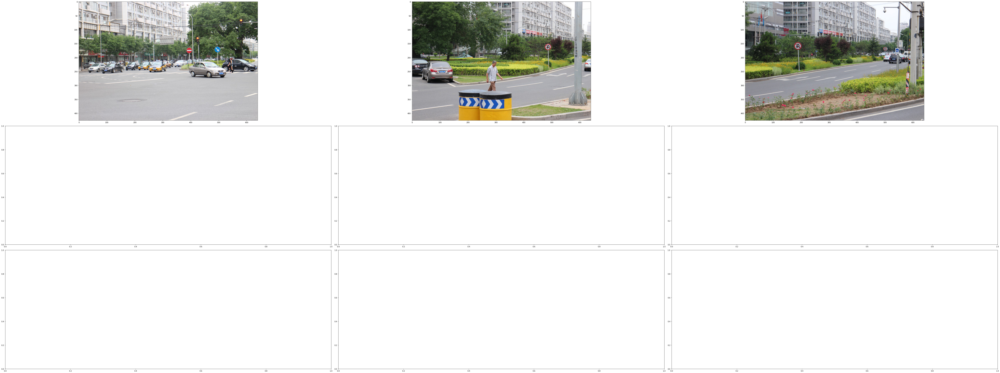

In [64]:
# Visualizing the sample images.
OUTPUT_PATH = 'ssd_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 9. 部署! <a class="anchor" id="head-9"></a>

If you trained a non-QAT model, you may export in FP32, FP16 or INT8 mode using the code block below. For INT8, you need to provide calibration image directory.

In [31]:
# tlt-export will fail if .etlt already exists. So we clear the export folder before tlt-export
!rm -rf $USER_EXPERIMENT_DIR/export
!mkdir -p $USER_EXPERIMENT_DIR/export
# Export in FP32 mode. Change --data_type to fp16 for FP16 mode
!tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_075.tlt \
                -k $KEY \
                -o $USER_EXPERIMENT_DIR/export/ssd_mobilenet_v2_epoch_075.etlt \
                -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
                --batch_size 16 \
                --data_type fp32

# Uncomment to export in INT8 mode (generate calibration cache file).
# !tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_$EPOCH.tlt  \
#                 -o $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt \
#                 -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
#                 -k $KEY \
#                 --cal_image_dir  $USER_EXPERIMENT_DIR/data/testing/image_2 \
#                 --data_type int8 \
#                 --batch_size 16 \
#                 --batches 10 \
#                 --cal_cache_file $USER_EXPERIMENT_DIR/export/cal.bin  \
#                 --cal_data_file $USER_EXPERIMENT_DIR/export/cal.tensorfile

Using TensorFlow backend.
2020-09-06 17:24:43.922797: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-09-06 17:24:47.561080: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-09-06 17:24:47.561289: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-06 17:24:47.561937: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:08.0
2020-09-06 17:24:47.561964: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-09-06 17:24:47.562010: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully ope

2020-09-06 17:25:08.398618: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-06 17:25:08.399320: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:08.0
2020-09-06 17:25:08.399378: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-09-06 17:25:08.399431: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-09-06 17:25:08.399459: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2020-09-06 17:25:08.399474: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library li

`Note:` In this example, for ease of execution we restrict the number of calibrating batches to 10. TLT recommends the use of at least 10% of the training dataset for int8 calibration.

If you train a QAT model, you may only export in INT8 mode using following code block. This generates an etlt file and the corresponding calibration cache. You can throw away the calibration cache and just use the etlt file in tlt-converter or DeepStream for FP32 or FP16 mode. But please note this gives sub-optimal results. If you want to deploy in FP32 or FP16, you should disable QAT in training.

In [ ]:
# Uncomment to export QAT model in INT8 mode (generate calibration cache file).
# !rm -rf $USER_EXPERIMENT_DIR/export
# !mkdir -p $USER_EXPERIMENT_DIR/export
# !tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_$EPOCH.tlt  \
#                 -o $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt \
#                 -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
#                 -k $KEY \
#                 --data_type int8 \
#                 --cal_cache_file $USER_EXPERIMENT_DIR/export/cal.bin

In [ ]:
print('Exported model:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export

Verify engine generation using the `tlt-converter` utility included with the docker.

The `tlt-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tlt-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the converter for jetson from the dev zone link [here](https://developer.nvidia.com/tlt-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [32]:
# Convert to TensorRT engine (FP32)
!tlt-converter -k $KEY \
               -d 3,300,300 \
               -o NMS \
               -e $USER_EXPERIMENT_DIR/export/trt.engine \
               -m 16 \
               -t fp32 \
               -i nchw \
               $USER_EXPERIMENT_DIR/export/ssd_mobilenet_v2_epoch_075.etlt

# Convert to TensorRT engine (FP16)
# !tlt-converter -k $KEY \
#                -d 3,384,1248 \
#                -o NMS \
#                -e $USER_EXPERIMENT_DIR/export/trt.engine \
#                -m 16 \
#                -t fp16 \
#                -i nchw \
#                $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt

# Convert to TensorRT engine (INT8).
# !tlt-converter -k $KEY  \
#                -d 3,384,1248 \
#                -o NMS \
#                -c $USER_EXPERIMENT_DIR/export/cal.bin \
#                -e $USER_EXPERIMENT_DIR/export/trt.engine \
#                -b 8 \
#                -m 16 \
#                -t int8 \
#                -i nchw \
#                $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt

[INFO] Detected 1 inputs and 2 output network tensors.


In [33]:
print('Exported engine:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export/trt.engine

Exported engine:
------------
-rw-r--r-- 1 root root 8.5M Sep  6 17:27 /workspace/mydata/ssd/export/trt.engine


## 10. Verify the deployed model <a class="anchor" id="head-10"></a>
Verify the converted engine by visualizing TensorRT inferences.

In [37]:
# Infer using TensorRT engine

# The engine batch size once created, cannot be alterred. So if you wish to run with a different batch-size,
# please re-run tlt-convert.

!tlt-infer ssd -m $USER_EXPERIMENT_DIR/export/trt.engine \
               -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -i /workspace/mydata/ssd/test_samples \
               -o $USER_EXPERIMENT_DIR/ssd_infer_images \
               -t 0.2

Using TensorFlow backend.
2020-09-06 17:29:57.927314: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-09-06 17:30:00,766 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_mobilenet_v2_kitti.txt
[TensorRT] WARNING: Current optimization profile is: 0. Please ensure there are no enqueued operations pending in this context prior to switching profiles
Using TensorRT engine for inference, setting batch size to engine's one: 16
100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


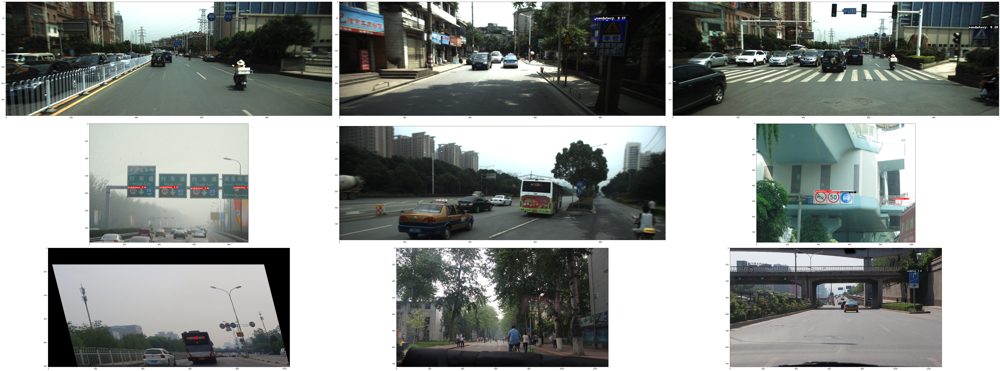

In [38]:
# Visualizing the sample images.
OUTPUT_PATH = 'ssd_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)